# Intro to Colab
+ Text cells
+ Code cells
+ Runtime options 
+ Settings
+ Collaboration

In [1]:
print("Hello World")

Hello World


# Upload files


Choose one:


1. grab and drop
2. mount drive



In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Import relevant packages

In [5]:
import cv2
import numpy as np

from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

`cv2` corresponds to OpenCV (https://opencv.org/), an Open Source Computer Vision Library with a huge variety of tools for computer vision.

# Explore your image

## Read image

In [88]:
img = cv2.imread('drive/MyDrive/datattack/workshop-continental/datattack.png')

In [89]:
print(img)

[[[ 66  43   0]
  [ 66  43   0]
  [ 66  43   0]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]

 [[ 66  43   0]
  [ 66  43   0]
  [ 66  43   0]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]

 [[ 66  43   0]
  [ 66  43   0]
  [ 66  43   0]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]

 ...

 [[ 82  57  13]
  [ 83  58  14]
  [ 85  59  15]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]

 [[112  82  36]
  [112  82  36]
  [112  82  36]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]

 [[ 72  48   5]
  [ 66  43   0]
  [ 66  43   0]
  ...
  [ 66  43   0]
  [ 66  43   0]
  [ 67  44   2]]]


## Show image

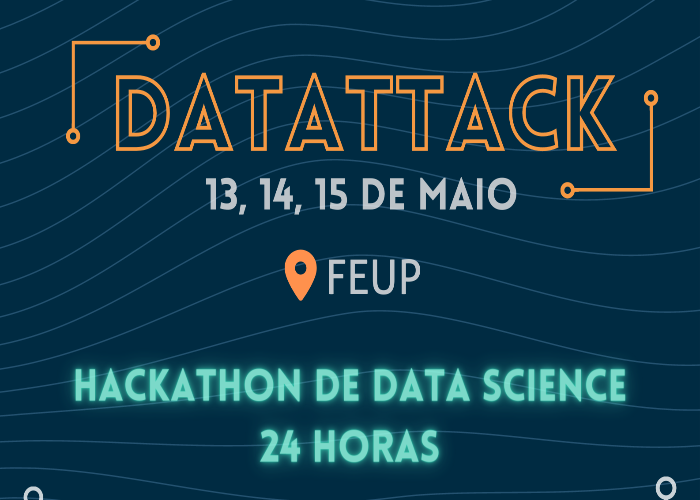

In [90]:
cv2_imshow(img)

## Check shape and size

In [91]:
print(img.shape)

(500, 700, 3)


In [92]:
print(img.size)

1050000


In [93]:
500*700*3

1050000

## Image channels

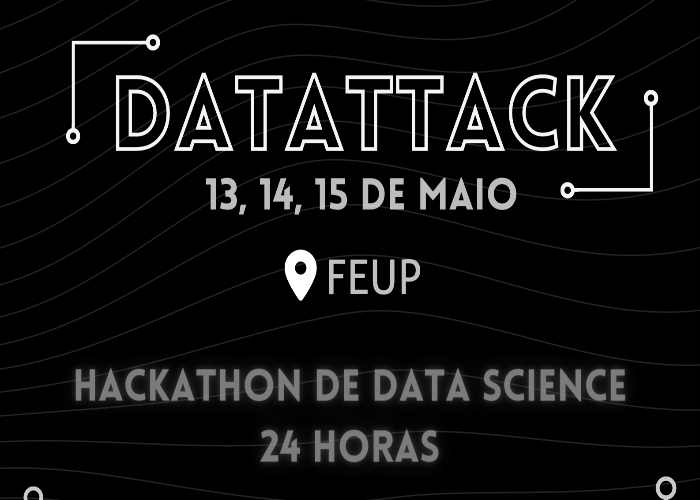

In [94]:
b, g, r = cv2.split(img)

cv2_imshow(r)

In [95]:
block = img[125:128, 125:128, 1]
print(block)
cv2_imshow(block)

[[43 43 43]
 [43 43 43]
 [43 43 43]]


# Resize image

### Make it smaller

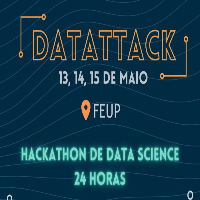

In [96]:
img_smaller = cv2.resize(img, (200, 200))
cv2_imshow(img_smaller)

### Make it bigger

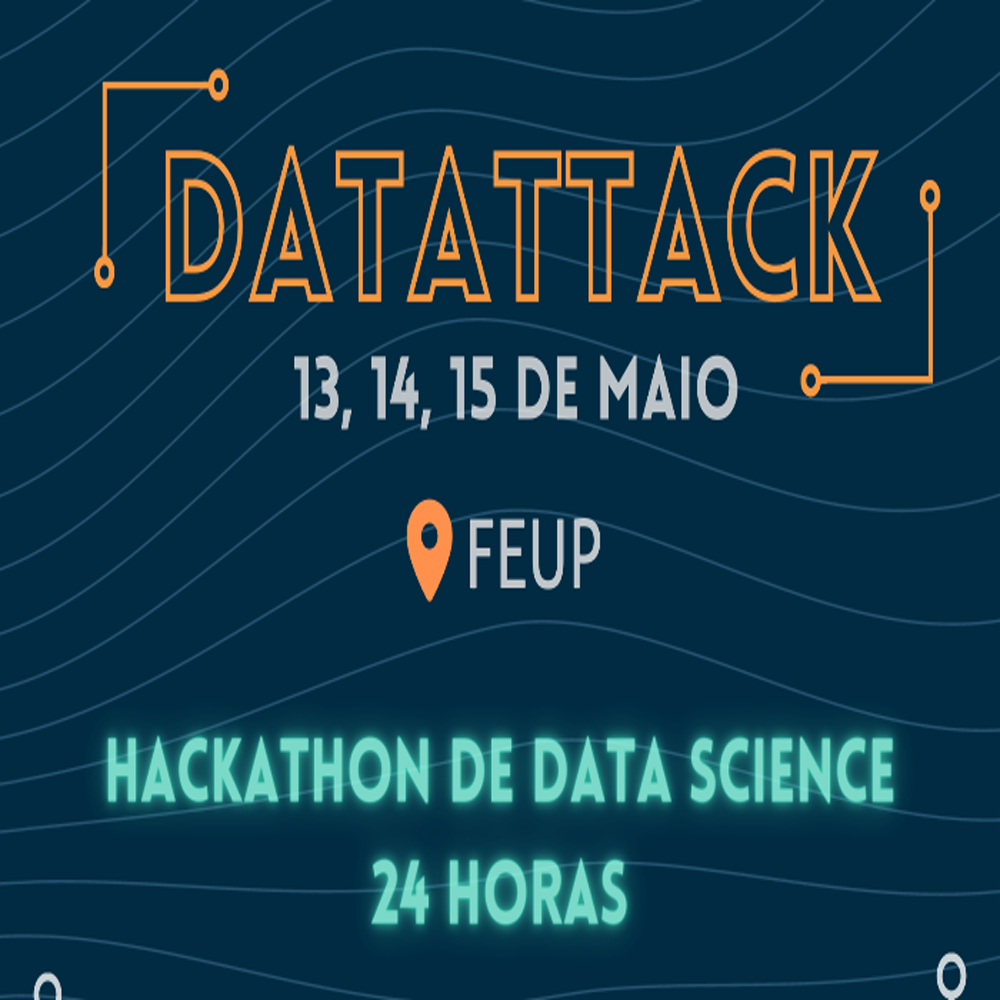

In [97]:
img_bigger = cv2.resize(img, (1000, 1000), interpolation = cv2.INTER_CUBIC)
cv2_imshow(img_bigger)

In [98]:
print(img_bigger.shape)

(1000, 1000, 3)


# Crop image

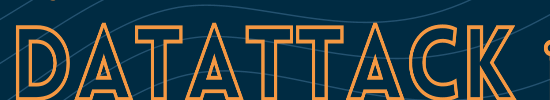

In [118]:
title = img[50:150, 100:650] # copy title
cv2_imshow(title)

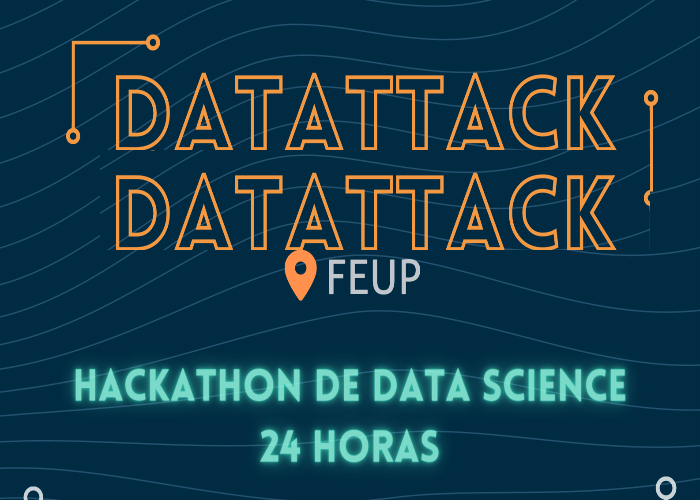

In [119]:
img_2 = img.copy()
img_2[150:250, 100:650] = title
cv2_imshow(img_2)

# Overlay images

In [125]:
photo = cv2.imread('drive/MyDrive/datattack/workshop-continental/feup.jpg')
logo = img

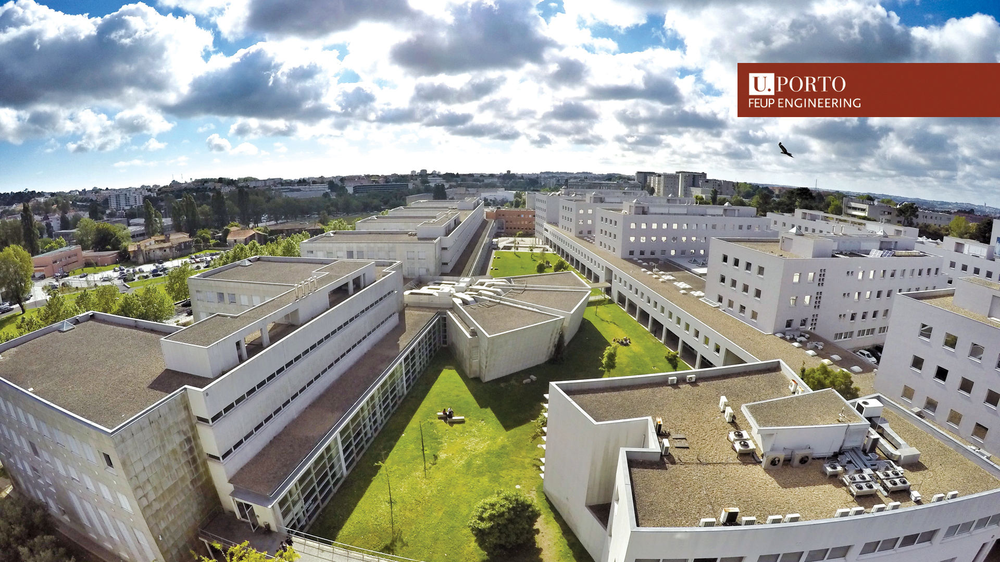

In [126]:
cv2_imshow(photo)

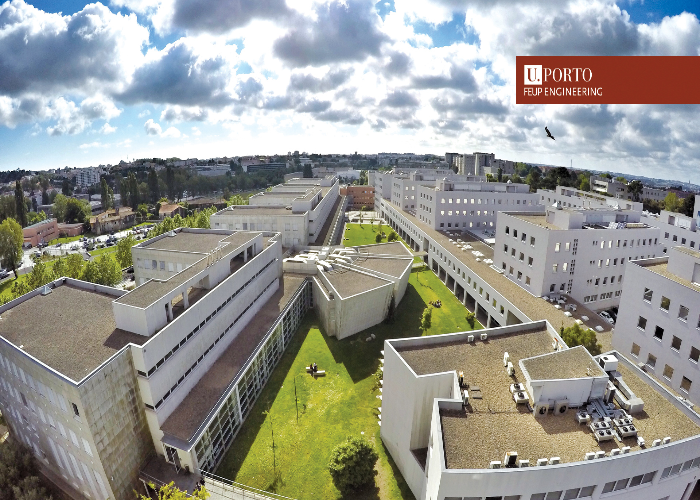

In [127]:
photo_resized = cv2.resize(photo, (700, 500))
cv2_imshow(photo_resized)

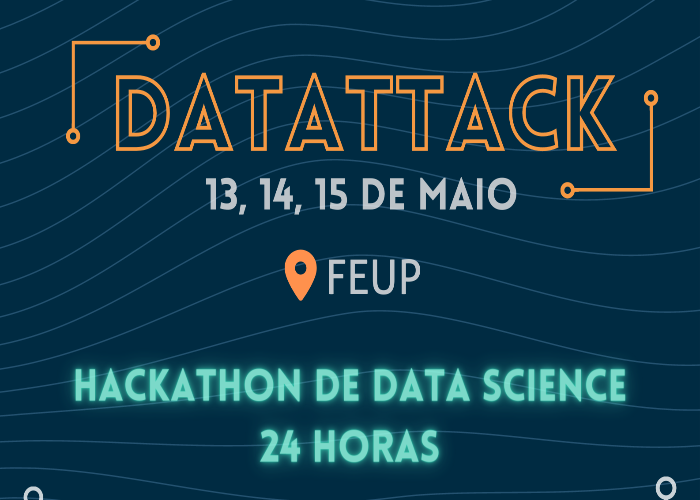

In [128]:
cv2_imshow(logo)

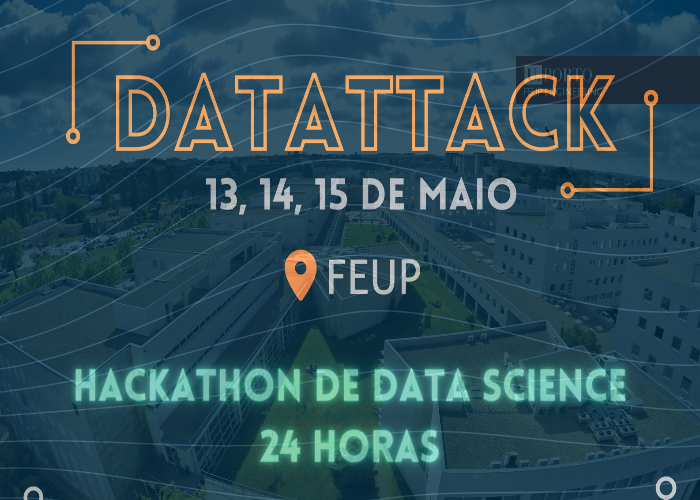

In [131]:
overlayed = cv2.addWeighted(logo, .8 , photo_resized, .2 , 0) # img1, weight, img2, weight, gamma value
cv2_imshow(overlayed)

In [133]:
cv2.imwrite("overlay.jpg", overlayed)

True

# Morphological operations

## Convert to grayscale

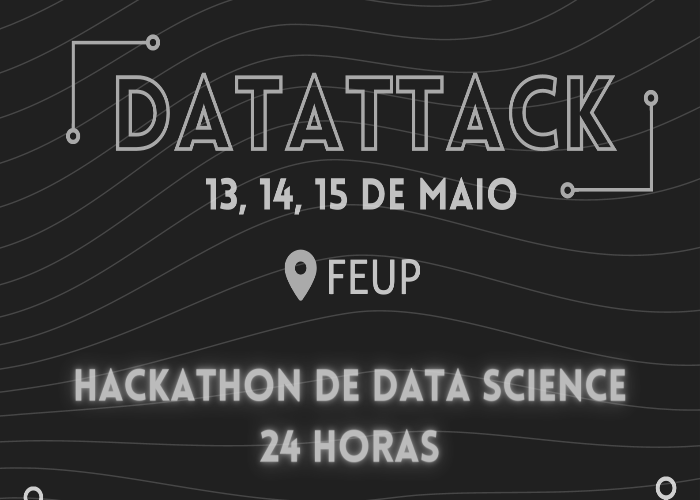

In [134]:
img_gray = cv2.imread('drive/MyDrive/datattack/workshop-continental/datattack.png', cv2.IMREAD_GRAYSCALE)
cv2_imshow(img_gray)

## Convert to binary

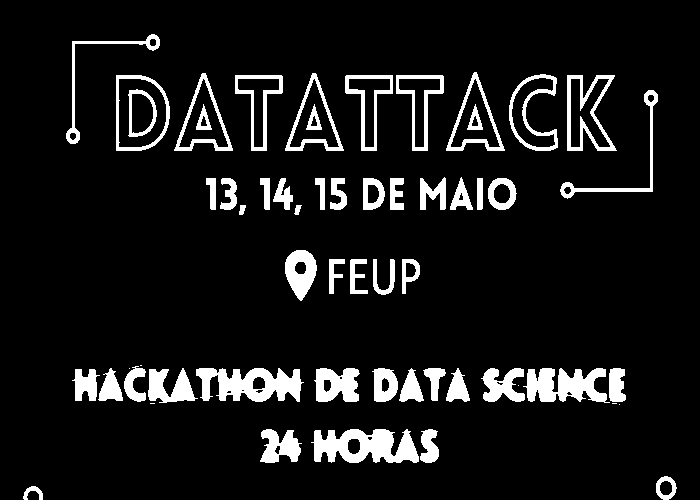

In [143]:
_, mask = cv2.threshold(img_gray, 90, 255, cv2.THRESH_BINARY)
cv2_imshow(mask)

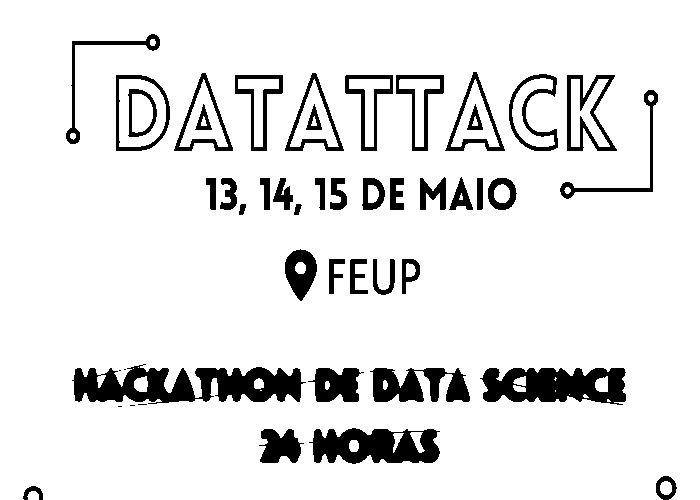

In [136]:
_, mask = cv2.threshold(img_gray, 80, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(mask)

## Define kernel

In [137]:
kernel = np.ones((3, 3), np.uint8)  # white square
print(kernel)

[[1 1 1]
 [1 1 1]
 [1 1 1]]


### Dilation

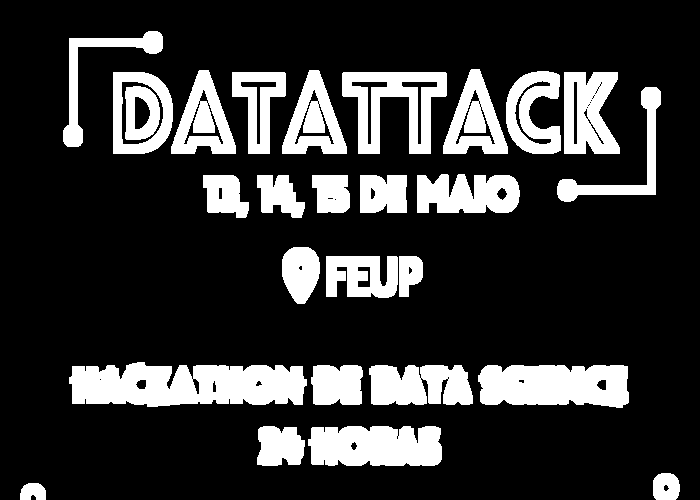

In [145]:
dilation = cv2.dilate(mask, kernel, iterations=3) # You can play with the number of iterations
cv2_imshow(dilation)

### Erosion

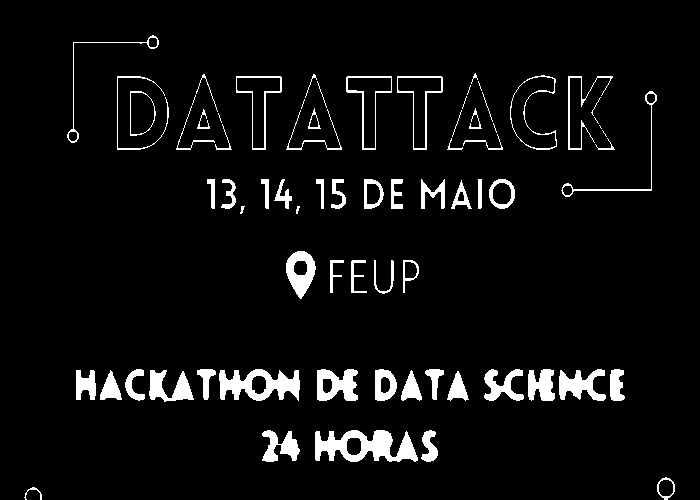

In [146]:
erosion = cv2.erode(mask, kernel, iterations=1)
cv2_imshow(erosion)

### Morphological Gradient

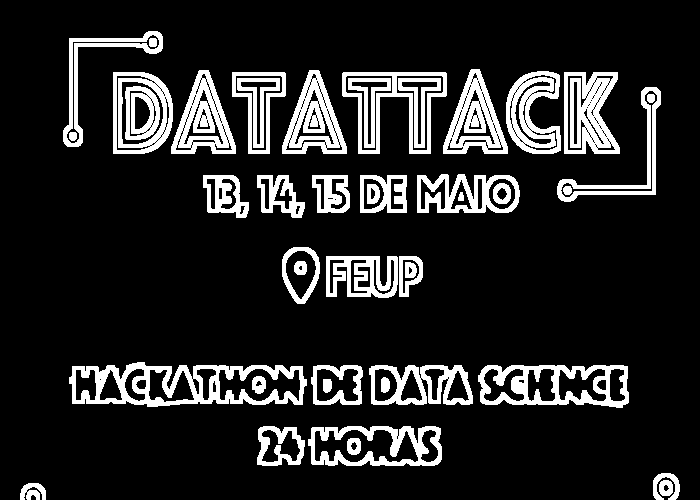

In [147]:
gradient = dilation - erosion
cv2_imshow(gradient)

# Filters

## Blur

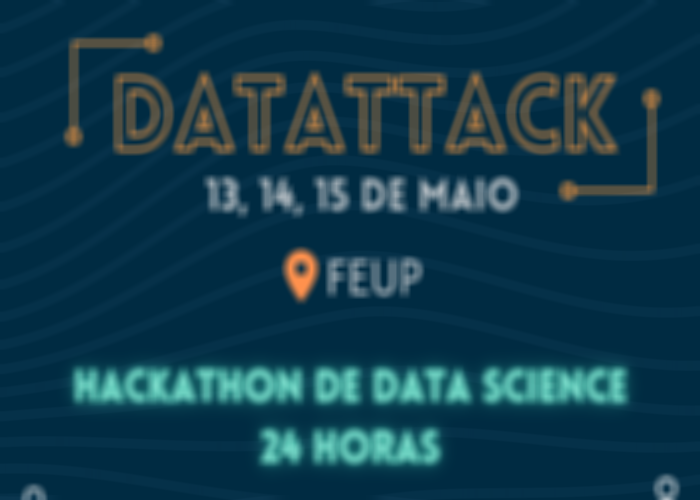

In [148]:
blur = cv2.blur(img, (10, 10)) 
cv2_imshow(blur)

## Sharpen

https://en.wikipedia.org/wiki/Kernel_(image_processing)

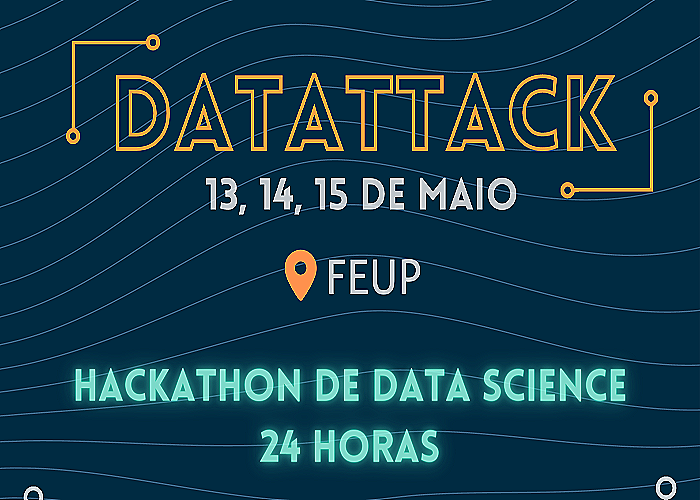

In [149]:
kernel = np.array([[0,-1,0], 
                    [-1, 5,-1],
                    [0,-1,0]])
sharpened = cv2.filter2D(img, -1, kernel)
cv2_imshow(sharpened)

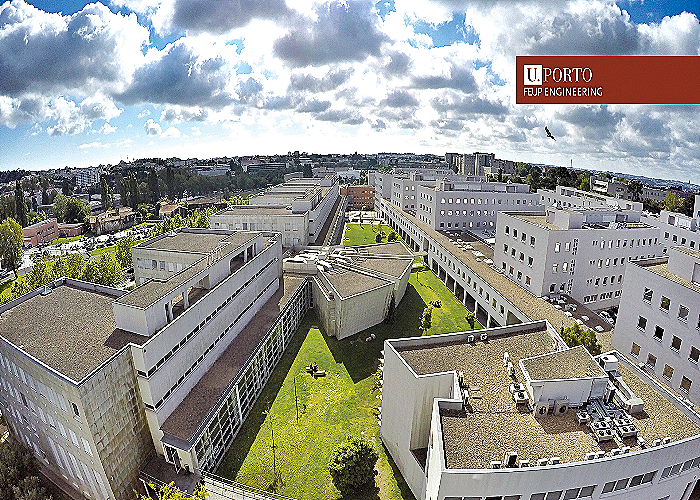

In [151]:
sharpened = cv2.filter2D(photo_resized, -1, kernel)
cv2_imshow(sharpened)

## Edge Detection

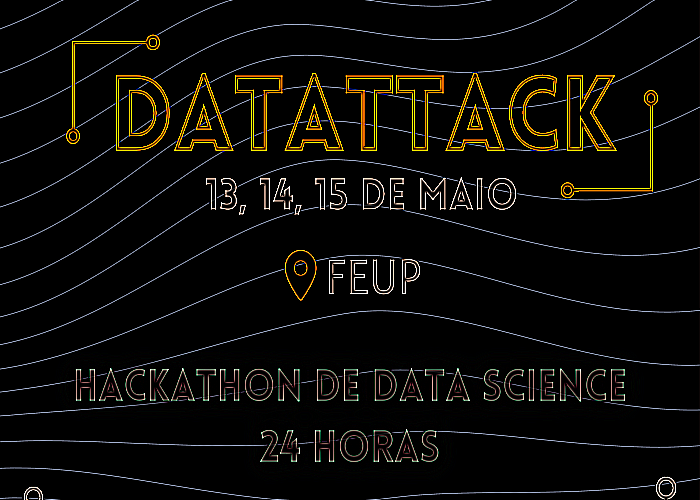

In [152]:
kernel = np.array([[-1,-1,-1], 
                    [-1, 8,-1],
                    [-1,-1,-1]])
edges = cv2.filter2D(img, -1, kernel)
cv2_imshow(edges)

## Sepia

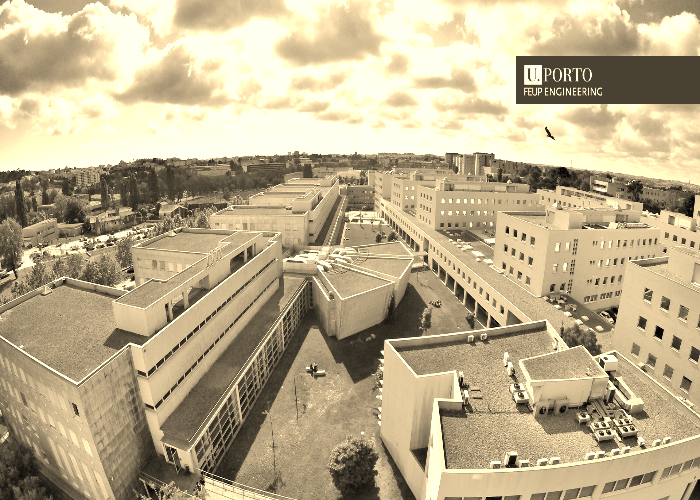

In [154]:
kernel = np.array([[0.272, 0.534, 0.131],
                   [0.349, 0.686, 0.168],
                   [0.393, 0.769, 0.189]])

sepia_img=cv2.transform(photo_resized, kernel)
cv2_imshow(sepia_img)

# Face Detection

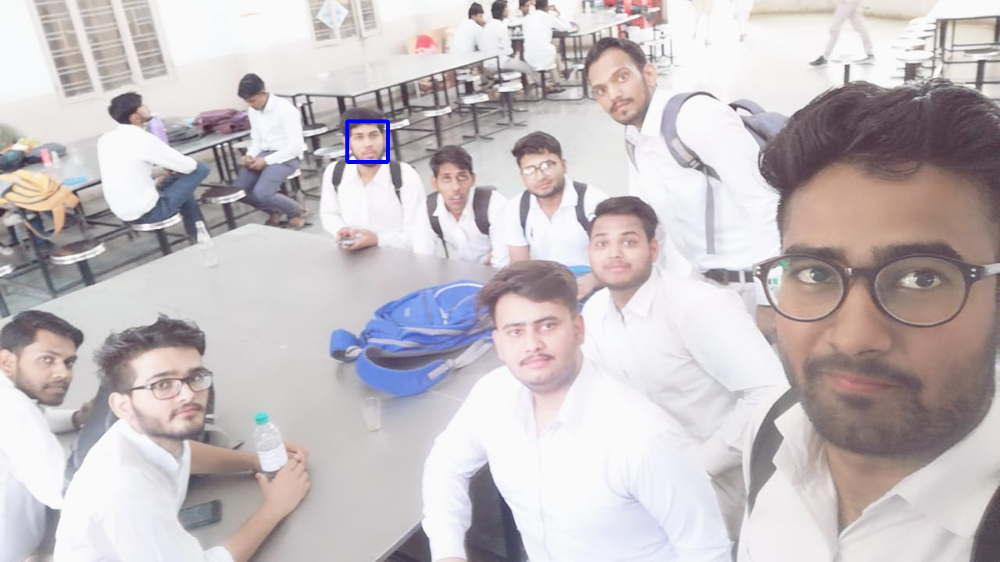

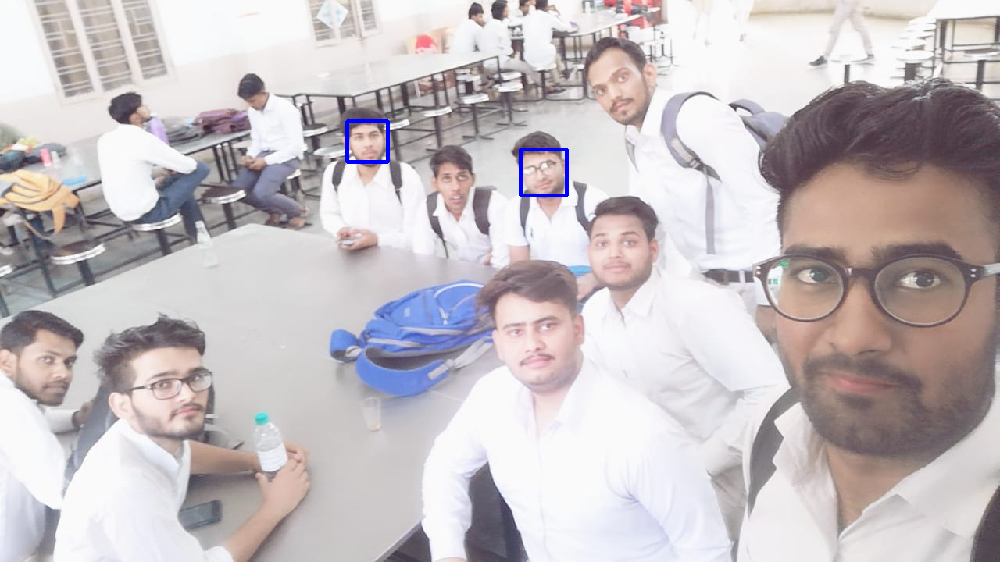

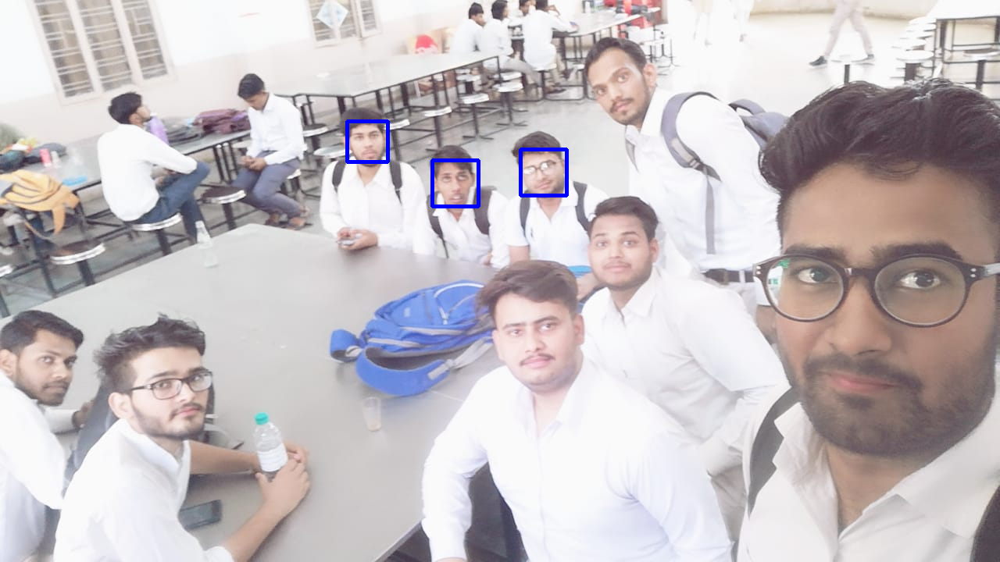

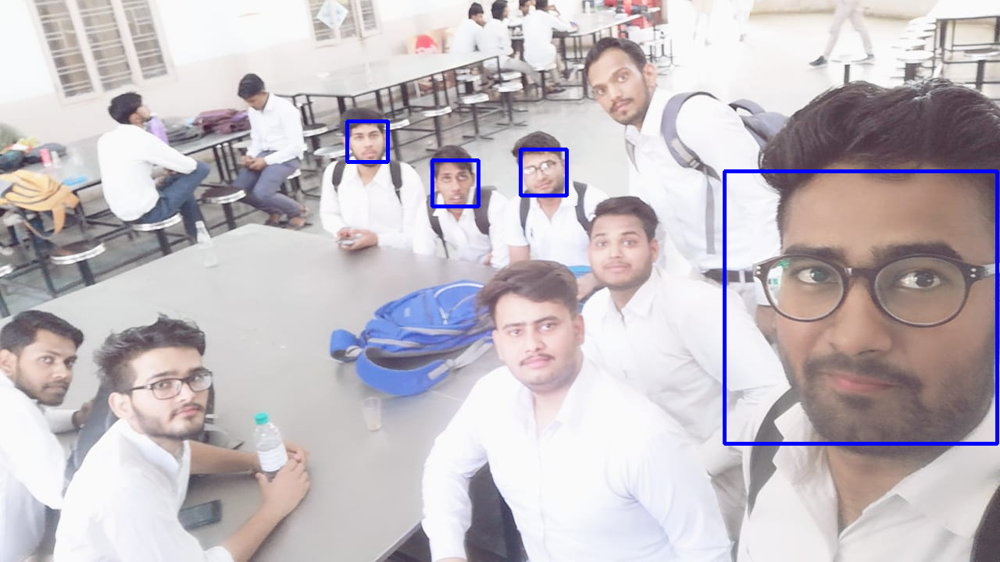

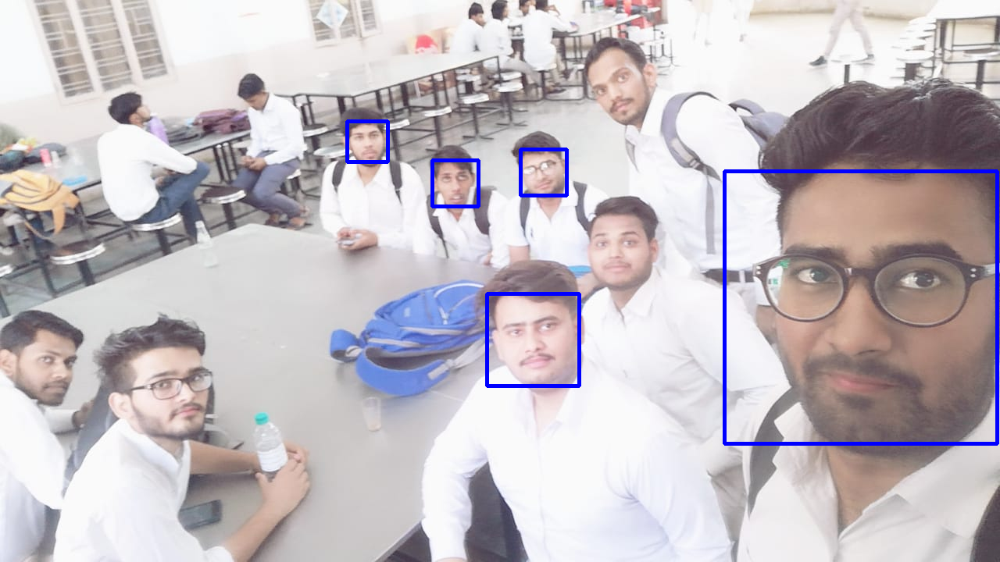

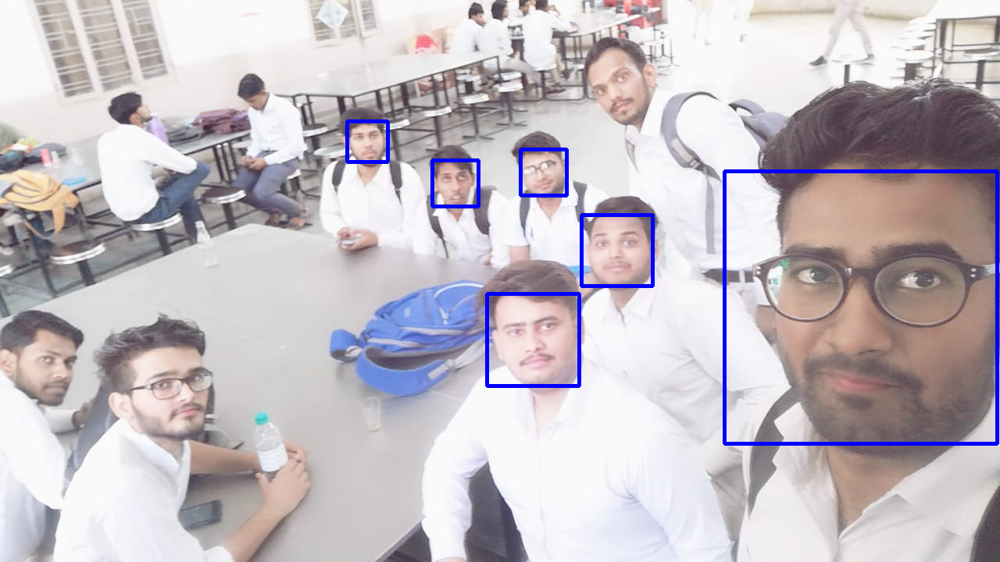

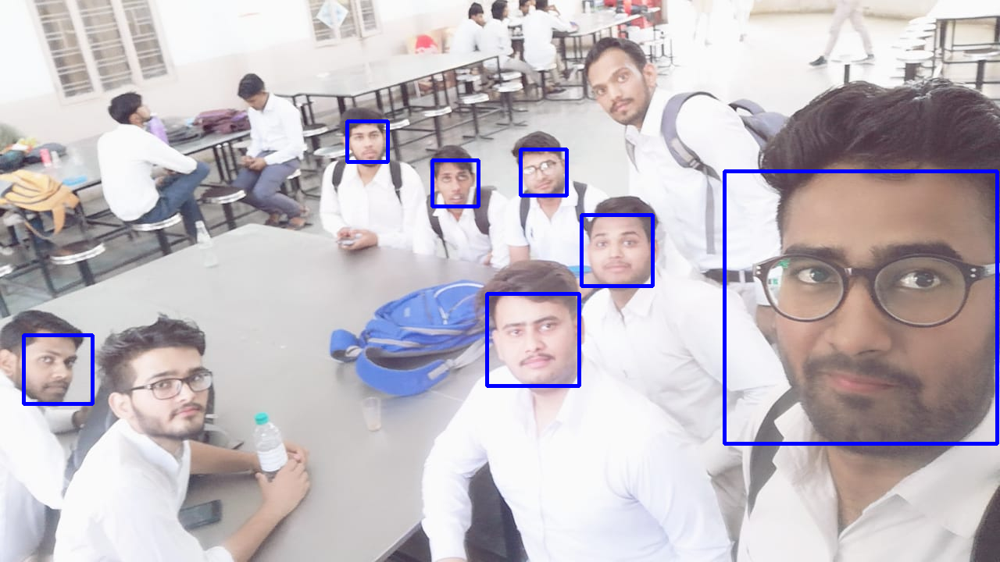

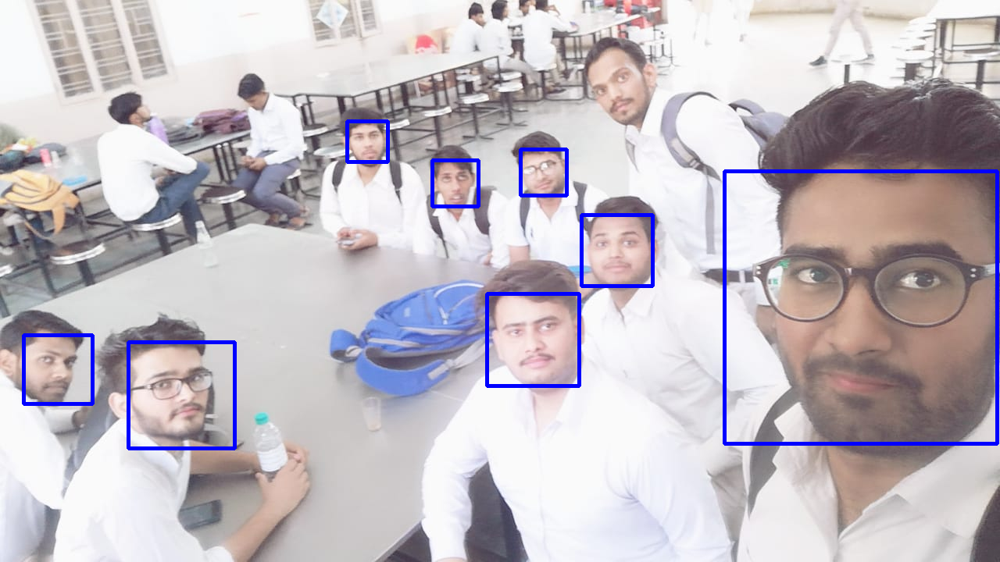

In [155]:
face_cascade = cv2.CascadeClassifier('drive/MyDrive/datattack/workshop-continental/haarcascade_frontalface_default.xml') # from opencv github repository
img = cv2.imread('drive/MyDrive/datattack/workshop-continental/faces_sample.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.2, 4)# image, scale factor - specify how much the image size is reduced at each image scale, minNeighbors - specify how many neighbours each candidate rectangle have to retain it.

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x,y), (x+w, y+h), (255, 0, 0), 3)
    cv2_imshow(img)
